In [2]:
# --- Cell 1: Vial Image/Dataset Generator ---
import os
import csv
import random
from PIL import Image as PILImage
import ipywidgets as widgets
from IPython.display import display, clear_output
from IPython.display import Image as IPImage

# --- Path Settings ---
image_dir = r"C:\Users\david\Documents\Vial Organizer Machine Learning\Images\Vial Slot Images"
preview_path = r"C:\Users\david\Documents\Vial Organizer Machine Learning\Images\Vial Preview Images\Generator Preview Image.png"
image_save_dir = r"C:\Users\david\Documents\Vial Organizer Machine Learning\Images\Vial Dataset Genreator Images"

# --- Cap Types and Grid ---
cap_types = ["Empty", "Black", "Blue", "Red", "White", "No-Cap"]
grid_size = 3
grid_state = [["Empty" for _ in range(grid_size)] for _ in range(grid_size)]
grid_buttons = [[None for _ in range(grid_size)] for _ in range(grid_size)]

# --- Preview Output Widget ---
preview_output = widgets.Output()

def update_preview(image_path=None):
    preview_output.clear_output()
    with preview_output:
        if image_path and os.path.exists(image_path):
            display(IPImage(filename=image_path, width=460))
        else:
            empty_path = os.path.join(image_dir, "Empty Vial Holder.png")
            if os.path.exists(empty_path):
                display(IPImage(filename=empty_path, width=460))

def generate_base_image():
    base = PILImage.open(os.path.join(image_dir, "Empty Vial Holder.png")).convert("RGBA")
    for row in range(grid_size):
        for col in range(grid_size):
            cap = grid_state[row][col]
            if cap == "Empty":
                continue
            filename = f"No-Cap - {row+1}-{col+1}.png" if cap == "No-Cap" else f"{cap}-Cap - {row+1}-{col+1}.png"
            img_path = os.path.join(image_dir, filename)
            if os.path.exists(img_path):
                overlay = PILImage.open(img_path).convert("RGBA")
                base = PILImage.alpha_composite(base, overlay)
            else:
                print(f"⚠️ Missing image for: {filename}")
    return base

def generate_preview_image():
    os.makedirs(os.path.dirname(preview_path), exist_ok=True)
    preview_image = generate_base_image()
    preview_image.save(preview_path)
    update_preview(preview_path)

def cycle_cap(row, col):
    current = grid_state[row][col]
    next_index = (cap_types.index(current) + 1) % len(cap_types)
    grid_state[row][col] = cap_types[next_index]
    grid_buttons[row][col].description = cap_types[next_index]
    generate_preview_image()

def create_grid():
    for row in range(grid_size):
        for col in range(grid_size):
            btn = widgets.Button(description=grid_state[row][col], layout=widgets.Layout(width="150px", height="50px"))
            btn.on_click(lambda b, r=row, c=col: cycle_cap(r, c))
            grid_buttons[row][col] = btn
    return widgets.VBox([widgets.HBox(row) for row in grid_buttons])

def randomize_grid(b):
    for row in range(grid_size):
        for col in range(grid_size):
            cap = random.choice(cap_types)
            grid_state[row][col] = cap
            grid_buttons[row][col].description = cap
    generate_preview_image()

def reset_grid(b=None):
    for row in range(grid_size):
        for col in range(grid_size):
            grid_state[row][col] = "Empty"
            grid_buttons[row][col].description = "Empty"
    generate_preview_image()

def get_next_file_index():
    existing = [f for f in os.listdir(image_save_dir) if f.startswith("ML Vial Set ") and f.endswith(".png")]
    numbers = []
    for f in existing:
        try:
            number = int(f.replace("ML Vial Set ", "").replace(".png", ""))
            numbers.append(number)
        except:
            continue
    return max(numbers + [0]) + 1

def save_image(b=None, index_override=None):
    image_save_dir = r"C:\Users\david\Documents\Vial Organizer Machine Learning\Images\Vial Generator Output Images"
    os.makedirs(image_save_dir, exist_ok=True)

    # Get next available index
    existing = [f for f in os.listdir(image_save_dir) if f.startswith("Vial Holder Generator Output ") and f.endswith(".png")]
    numbers = []
    for f in existing:
        try:
            number = int(f.replace("Vial Holder Generator Output ", "").replace(".png", ""))
            numbers.append(number)
        except:
            continue
    next_index = max(numbers + [0]) + 1 if index_override is None else index_override

    image_filename = f"Vial Holder Generator Output {next_index}.png"
    image_path = os.path.join(image_save_dir, image_filename)

    try:
        final_image = generate_base_image()
        final_image.save(image_path)
        print(f"✅ Saved: {image_filename}")
        update_preview(image_path)
    except Exception as e:
        print(f"❌ Error: {e}")

import time  # Make sure this import is included at the top

def generate_100_sets(b):
    dataset_save_dir = r"C:\Users\david\Documents\Vial Organizer Machine Learning\Images\Vial Dataset Generator Images"
    os.makedirs(dataset_save_dir, exist_ok=True)

    # Get next available index
    existing = [f for f in os.listdir(dataset_save_dir) if f.startswith("Vial Dataset Generator Output ") and f.endswith(".png")]
    numbers = []
    for f in existing:
        try:
            number = int(f.replace("Vial Dataset Generator Output ", "").replace(".png", ""))
            numbers.append(number)
        except:
            continue
    start_index = max(numbers + [0]) + 1

    for i in range(100):
        # Randomize grid state
        for row in range(grid_size):
            for col in range(grid_size):
                cap = random.choice(cap_types)
                grid_state[row][col] = cap
                grid_buttons[row][col].description = cap

        # Update preview with current grid
        generate_preview_image()

        # Pause so user sees the preview
        time.sleep(1)  # You can use 0.5 or 2 depending on your preference

        # Save current image
        file_index = start_index + i
        filename = f"Vial Dataset Generator Output {file_index}.png"
        path = os.path.join(dataset_save_dir, filename)

        try:
            img = generate_base_image()
            img.save(path)
            print(f"✅ Saved: {filename}")
        except Exception as e:
            print(f"❌ Error saving {filename}: {e}")

# --- UI Buttons ---
randomize_btn = widgets.Button(description="🎲 Randomize", button_style="primary", layout=widgets.Layout(width="150px"))
reset_btn = widgets.Button(description="🔄 Reset", button_style="warning", layout=widgets.Layout(width="150px"))
save_btn = widgets.Button(description="💾 Save Image", button_style="success", layout=widgets.Layout(width="150px"))
generator_100_btn = widgets.Button(description="⚙️ Dataset Generator (100)", button_style="danger", layout=widgets.Layout(width="459px", height="50px"))

randomize_btn.on_click(randomize_grid)
reset_btn.on_click(reset_grid)
save_btn.on_click(save_image)
generator_100_btn.on_click(generate_100_sets)

# --- Layout ---
grid_ui = create_grid()
clear_output()
update_preview()

display(widgets.VBox([
    preview_output,
    grid_ui,
    widgets.HBox([randomize_btn, reset_btn, save_btn]),
    widgets.HBox([generator_100_btn])
]))

In [3]:
# --- Cell 2: Shared Grid Placement Parameters ---
slot_width = 550   # Width of each vial slot
slot_height = 575  # Height of each vial slot
x_offset = 300     # Left margin from image border to first slot
y_offset = 125     # Top margin from image border to first slot
x_gap = 35         # Horizontal gap between slots
y_gap = 20         # Vertical gap between slots

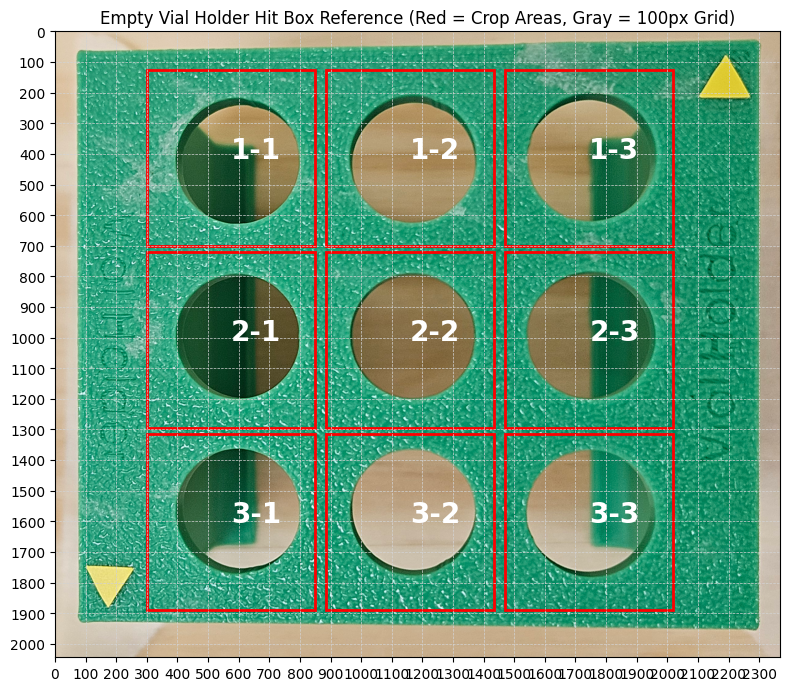

In [4]:
# --- Cell 3: Hit Box Visualizer ---
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os

# --- Updated image path for Empty Vial Holder ---
empty_holder_path = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Slot Images/Empty Vial Holder.png"
img = Image.open(empty_holder_path)

# --- Plot with hit box and pixel grid overlay ---
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(img)
ax.set_title("Empty Vial Holder Hit Box Reference (Red = Crop Areas, Gray = 100px Grid)")

# Get image dimensions
img_width, img_height = img.size

# Draw gray pixel grid every 100px
ax.set_xticks(range(0, img_width + 1, 100))
ax.set_yticks(range(0, img_height + 1, 100))
ax.grid(which='both', color='lightgray', linestyle='--', linewidth=0.5)

# Draw 3x3 red hit boxes using shared config from Cell 1
for row in range(3):
    for col in range(3):
        x = x_offset + col * (slot_width + x_gap)
        y = y_offset + row * (slot_height + y_gap)
        rect = patches.Rectangle((x, y), slot_width, slot_height,
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x + 275, y + 287.5, f"{row+1}-{col+1}", color='white', fontsize=20, weight='bold')

# Format axes
ax.set_xlim(0, img_width)
ax.set_ylim(img_height, 0)
plt.tight_layout()
plt.show()

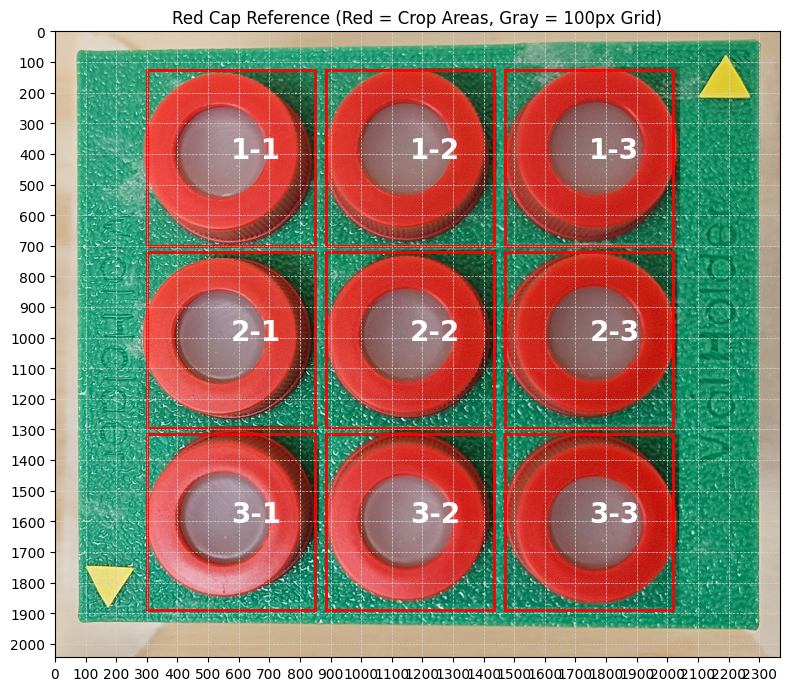

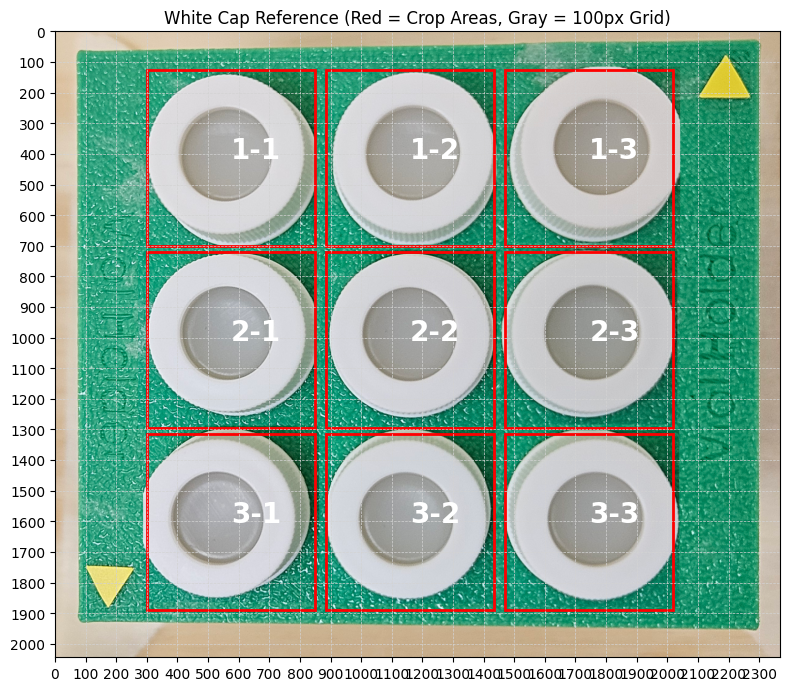

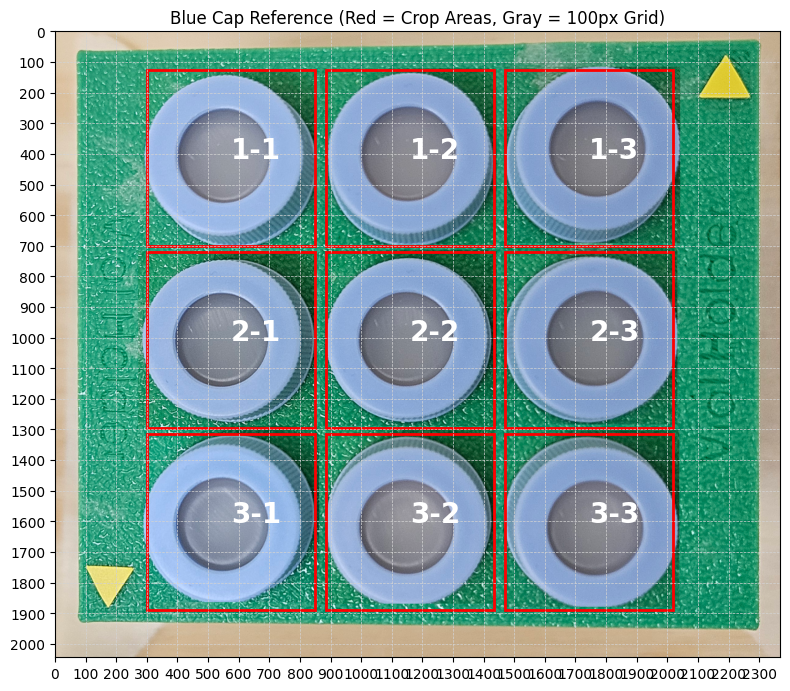

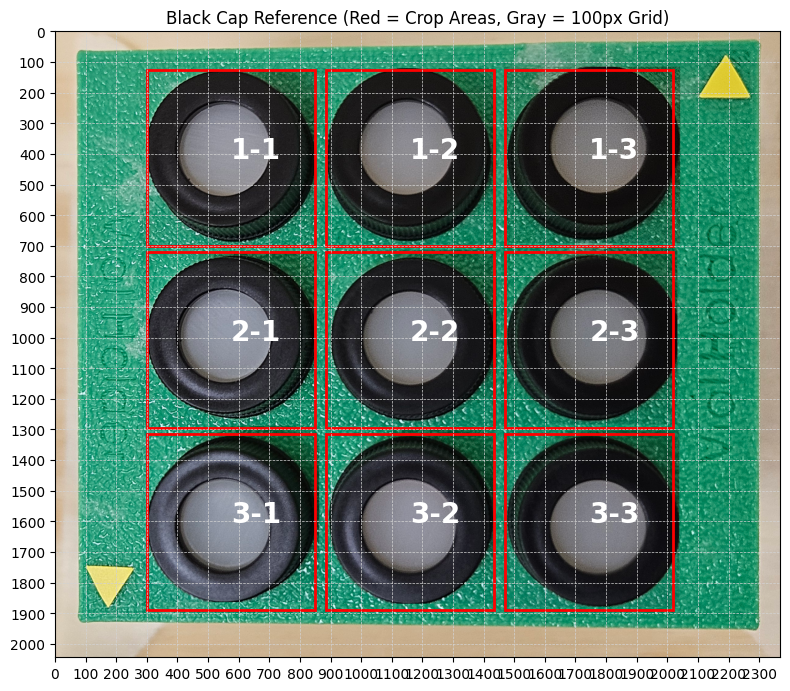

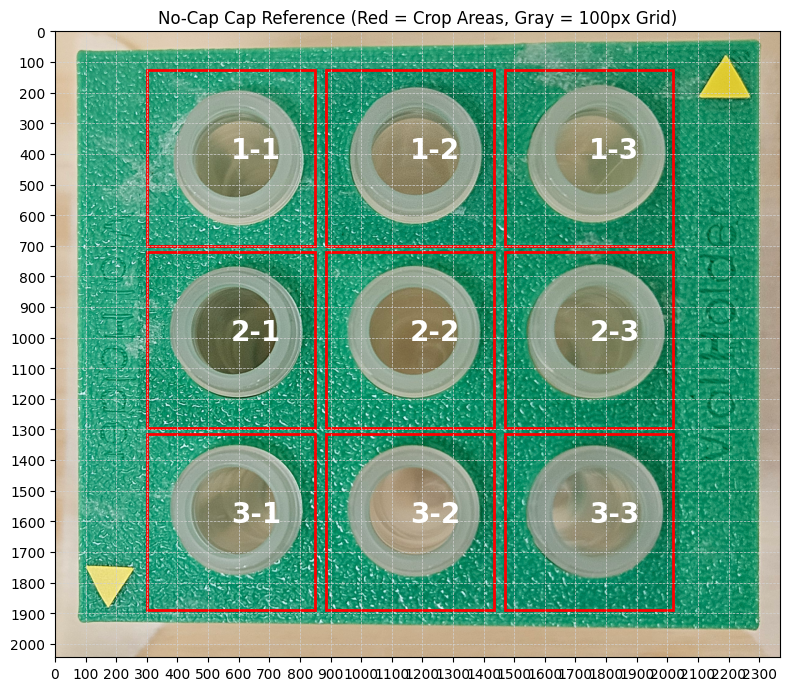

In [5]:
# --- Cell 4: Color Cap Reference ---
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os

# --- All Color Calibration Images ---
calibration_images = {
    "Red":   r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - Red Caps.png",
    "White": r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - White Caps.png",
    "Blue":  r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - Blue Caps.png",
    "Black": r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - Black Caps.png",
    "No-Cap":r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - No-Caps.png",
}

# --- Shared Grid Placement Parameters from Cell 2 ---
# (Assumes you already defined slot_width, slot_height, x_offset, y_offset, x_gap, y_gap)

for label, img_path in calibration_images.items():
    if not os.path.exists(img_path):
        print(f"⚠️ Missing image: {img_path}")
        continue

    img = Image.open(img_path)
    img_width, img_height = img.size

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img)
    ax.set_title(f"{label} Cap Reference (Red = Crop Areas, Gray = 100px Grid)")

    # Grid lines every 100px
    ax.set_xticks(range(0, img_width + 1, 100))
    ax.set_yticks(range(0, img_height + 1, 100))
    ax.grid(which='both', color='lightgray', linestyle='--', linewidth=0.5)

    # Hit box overlay
    for row in range(3):
        for col in range(3):
            x = x_offset + col * (slot_width + x_gap)
            y = y_offset + row * (slot_height + y_gap)
            rect = patches.Rectangle((x, y), slot_width, slot_height,
                                     linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            ax.text(x + 275, y + 287.5, f"{row+1}-{col+1}", color='white', fontsize=20, weight='bold')

    ax.set_xlim(0, img_width)
    ax.set_ylim(img_height, 0)
    plt.tight_layout()
    plt.show()

In [6]:
# --- Cell 5: Vial Color Calibartion Profile (JSON) ---
import numpy as np
from PIL import Image
import os
import json
import ipywidgets as widgets
from IPython.display import display, clear_output

# --- Color Calibration Image Paths ---
calibration_images = {
    "Empty":  r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Slot Images/Empty Vial Holder.png",
    "Red":    r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - Red Caps.png",
    "White":  r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - White Caps.png",
    "Blue":   r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - Blue Caps.png",
    "Black":  r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - Black Caps.png",
    "No-Cap": r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Color Calibrator Images/Color Cal - No-Caps.png",
}

# --- UI Components ---
save_button = widgets.Button(
    description="💾 Save Vial Color Calibration Profile",
    button_style="success",
    layout=widgets.Layout(width="460px", height="40px")
)
output = widgets.Output()

# --- Function to Extract & Save Calibration Data ---
def save_calibration_profile(b):
    output.clear_output()
    color_calibration = {}

    print("📦 Extracting average RGB per slot for each calibration image...\n")
    for label, path in calibration_images.items():
        if not os.path.exists(path):
            print(f"⚠️ Missing: {label} ({path})")
            continue

        img = Image.open(path).convert("RGB")
        img_np = np.array(img)

        print(f"🎯 {label} Cap Image:")
        color_calibration[label] = {}

        for row in range(3):
            for col in range(3):
                x = x_offset + col * (slot_width + x_gap)
                y = y_offset + row * (slot_height + y_gap)
                slot = img_np[y:y+slot_height, x:x+slot_width]
                avg_rgb = np.mean(slot.reshape(-1, 3), axis=0).astype(int)
                label_str = f"{row+1}-{col+1}"
                color_calibration[label][label_str] = tuple(avg_rgb)
                print(f"  Slot {label_str}: RGB = {tuple(avg_rgb)}")
        print()

    # --- Save to JSON ---
    calibration_output_path = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Files/Vial Color Calibration Profile.json"
    calibration_data_serialized = {
        label: {slot: [int(v) for v in rgb] for slot, rgb in slot_data.items()}
        for label, slot_data in color_calibration.items()
    }
    
    with open(calibration_output_path, 'w') as f:
        json.dump(calibration_data_serialized, f, indent=2)
        
# Connect button to function
save_button.on_click(lambda b: save_calibration_profile(b))

# Display UI
display(widgets.VBox([save_button, output]))

In [7]:
# --- Cell 6: Vial Dataset Generator Output Selector ---
import os
import ipywidgets as widgets
from IPython.display import display

# Define the image folder path
image_folder = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Dataset Generator Images"

# Collect PNG images from the folder
image_files = sorted([f for f in os.listdir(image_folder) if f.endswith(".png")])

# Create a dropdown widget
dropdown = widgets.Dropdown(
    options=image_files,
    description='Select Image:',
    layout=widgets.Layout(width='500px')
)

# Display the dropdown
display(dropdown)

Dropdown(description='Select Image:', layout=Layout(width='500px'), options=('Vial Dataset Generator Output 1.…

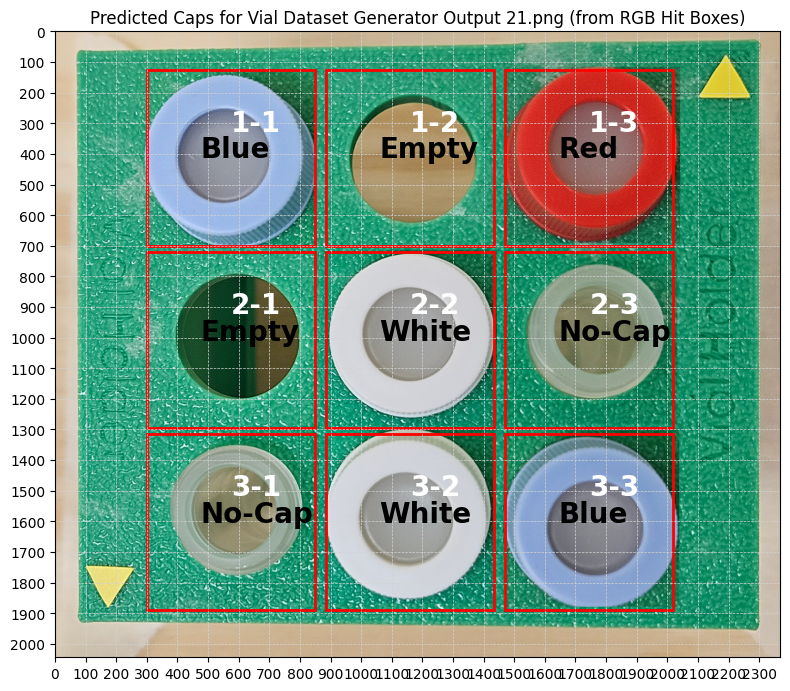

In [8]:
# --- Cell 7: Predicted Caps for Vial Dataset Generator Output from Selector ---
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
import os
import json

# --- Load the selected image from dropdown ---
selected_image_path = os.path.join(image_folder, dropdown.value)
selected_filename = os.path.basename(selected_image_path)
img = Image.open(selected_image_path).convert("RGB")
img_np = np.array(img)
img_width, img_height = img.size

# --- Load saved calibration profile ---
calibration_path = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Files/Vial Color Calibration Profile.json"
with open(calibration_path, 'r') as f:
    calibration_profiles = json.load(f)

# --- Helper to find closest cap type ---
def closest_cap(avg_rgb, profiles):
    min_dist = float('inf')
    best_label = "Unknown"
    for label, slot_rgbs in profiles.items():
        for slot_rgb in slot_rgbs.values():
            dist = np.linalg.norm(np.array(avg_rgb) - np.array(slot_rgb))
            if dist < min_dist:
                min_dist = dist
                best_label = label
    return best_label

# --- Plot image with overlay and predictions ---
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(img)
ax.set_title(f"Predicted Caps for {selected_filename} (from RGB Hit Boxes)")

# Draw gray pixel grid every 100px
ax.set_xticks(range(0, img_width + 1, 100))
ax.set_yticks(range(0, img_height + 1, 100))
ax.grid(which='both', color='lightgray', linestyle='--', linewidth=0.5)

# Draw hit boxes, labels, and predictions
for row in range(3):
    for col in range(3):
        x = x_offset + col * (slot_width + x_gap)
        y = y_offset + row * (slot_height + y_gap)

        # Extract RGB from region
        crop = img_np[y:y+slot_height, x:x+slot_width]
        avg_rgb = crop.reshape(-1, 3).mean(axis=0).astype(int)

        # Predict label
        predicted_label = closest_cap(avg_rgb, calibration_profiles)

        # Draw hit box
        rect = patches.Rectangle((x, y), slot_width, slot_height,
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Draw black prediction label
        ax.text(x + 175, y + slot_height // 2, predicted_label,
                color='black', fontsize=20, weight='bold')

        # Draw white slot label
        ax.text(x + 275, y + 200, f"{row+1}-{col+1}",
                color='white', fontsize=20, weight='bold')

# Final display adjustments
ax.set_xlim(0, img_width)
ax.set_ylim(img_height, 0)
plt.tight_layout()
plt.show()

In [9]:
# --- Cell 8: Load Vial Color Calibartion Profile (JSON) File ---
import json
import numpy as np
from sklearn.neighbors import KNeighborsClassifier

# --- Load calibration profiles ---
calibration_path = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Files/Vial Color Calibration Profile.json"
with open(calibration_path, 'r') as f:
    calibration_profiles = json.load(f)

# --- Prepare training data for KNN ---
X_train = []
y_train = []

for label, slot_dict in calibration_profiles.items():
    for slot, rgb in slot_dict.items():
        X_train.append(rgb)
        y_train.append(label)

X_train = np.array(X_train)
y_train = np.array(y_train)

In [10]:
# --- Cell 9: Train k-NN Classifier ---
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

print("✅ k-NN model trained using color calibration profiles.")

✅ k-NN model trained using color calibration profiles.


In [11]:
# --- Cell 10: Trained k-NN Individual Tester ---
import os
import numpy as np
import json
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import ipywidgets as widgets
from IPython.display import display
from sklearn.neighbors import KNeighborsClassifier

# --- Paths ---
image_folder = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Dataset Generator Images"
json_path = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Files/Vial Color Calibration Profile.json"

# --- Load calibration profiles ---
with open(json_path, "r") as f:
    calibration_profiles = json.load(f)

# --- Prepare training data for K-NN ---
X_train = []
y_train = []
for label, slots in calibration_profiles.items():
    for pos, rgb in slots.items():
        X_train.append(rgb)
        y_train.append(label)

X_train = np.array(X_train)
y_train = np.array(y_train)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

# --- Prediction function ---
def predict_and_display(image_name):
    image_path = os.path.join(image_folder, image_name)
    img = Image.open(image_path).convert("RGB")
    img_np = np.array(img)

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img)
    ax.set_title(f"K-NN Cap Prediction for: {image_name}")

    for row in range(3):
        for col in range(3):
            x = x_offset + col * (slot_width + x_gap)
            y = y_offset + row * (slot_height + y_gap)
            region = img_np[y:y+slot_height, x:x+slot_width]
            avg_rgb = np.mean(region.reshape(-1, 3), axis=0)
            prediction = knn.predict([avg_rgb])[0]

            # Draw red hit box
            rect = patches.Rectangle((x, y), slot_width, slot_height, linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

            # Draw prediction label
            ax.text(x + 10, y + 30, prediction, fontsize=20, color='black', weight='bold', backgroundcolor='white')

            # Draw white slot label
            ax.text(x + 275, y + 200, f"{row+1}-{col+1}", color='white', fontsize=20, weight='bold')

    ax.set_xlim(0, img.width)
    ax.set_ylim(img.height, 0)
    plt.tight_layout()
    plt.show()

# --- Dropdown selector ---
image_files = sorted([f for f in os.listdir(image_folder) if f.lower().endswith('.png')])
dropdown = widgets.Dropdown(options=image_files, description='Select Image:', layout=widgets.Layout(width='400px'))
predict_btn = widgets.Button(description="🔍 Predict", button_style='info', layout=widgets.Layout(width='150px'))
output_area = widgets.Output()

def on_predict_clicked(b):
    output_area.clear_output()
    with output_area:
        predict_and_display(dropdown.value)

predict_btn.on_click(on_predict_clicked)

# --- Display UI ---
ui = widgets.HBox([dropdown, predict_btn])
display(ui, output_area)

Output()

📊 Sampling 5 images from 100 total



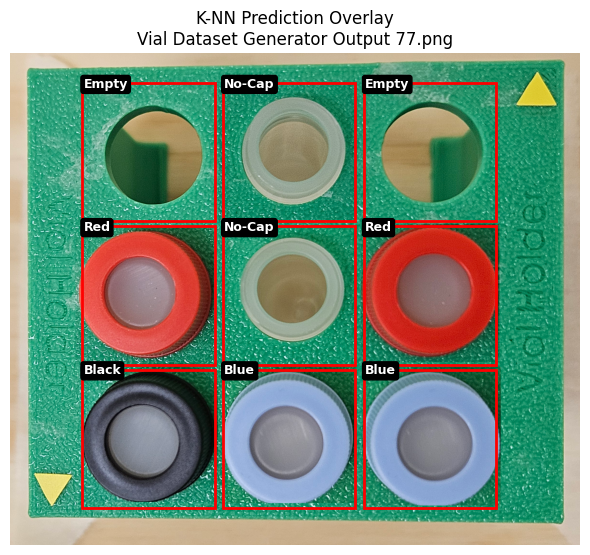

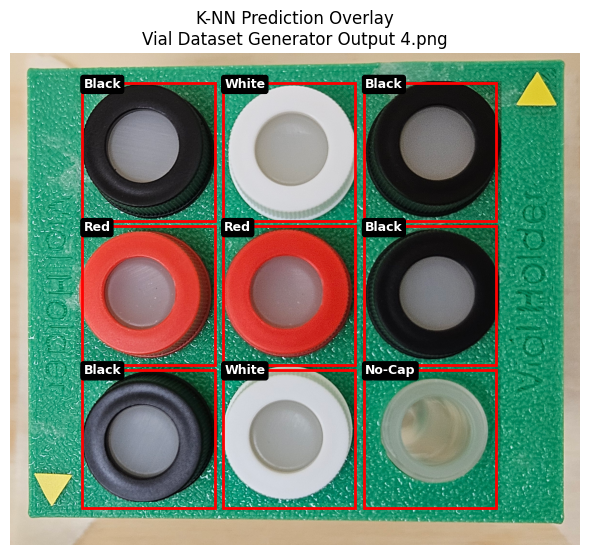

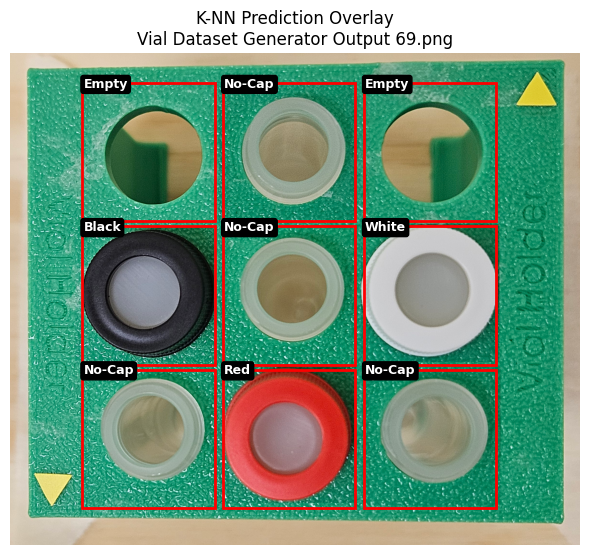

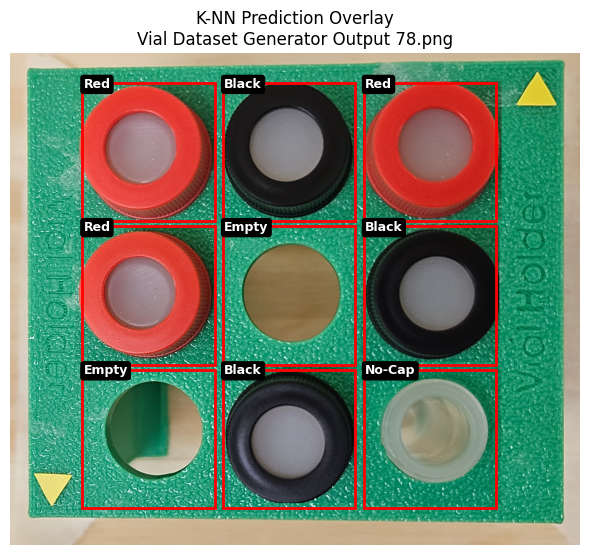

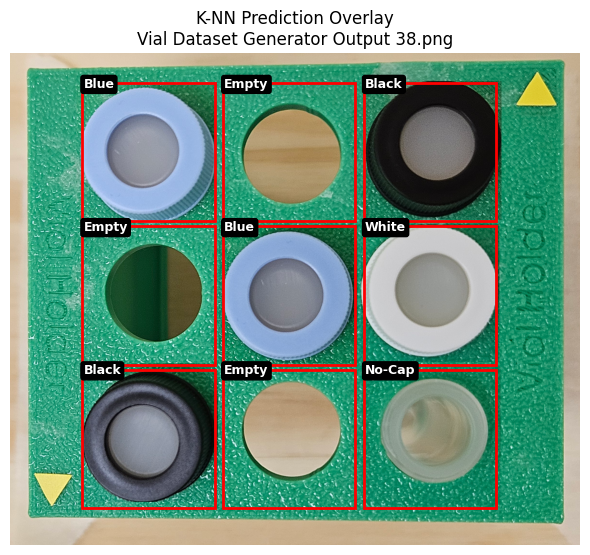

In [12]:
# --- Cell 11: Trained k-NN 5% of Dataset Tester ---
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
import random
from math import ceil

# --- Grab all image paths again ---
image_folder = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Dataset Generator Images"
image_paths = sorted([
    os.path.join(image_folder, f)
    for f in os.listdir(image_folder)
    if f.endswith(".png") and f.startswith("Vial Dataset Generator Output")
])

# --- Sample 5% of the dataset ---
population_size = len(image_paths)
sample_size = max(1, ceil(0.05 * population_size))  # Ensure at least 1 sample
sampled_paths = random.sample(image_paths, sample_size)

print(f"📊 Sampling {sample_size} images from {population_size} total\n")

# --- Run Prediction and Overlay Labels ---
for path in sampled_paths:
    img = Image.open(path).convert("RGB")
    img_np = np.array(img)
    img_height, img_width = img_np.shape[:2]

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(img_np)
    ax.set_title(f"K-NN Prediction Overlay\n{os.path.basename(path)}")

    for row in range(3):
        for col in range(3):
            x = x_offset + col * (slot_width + x_gap)
            y = y_offset + row * (slot_height + y_gap)
            slot = img_np[y:y+slot_height, x:x+slot_width]

            avg_rgb = slot.reshape(-1, 3).mean(axis=0).astype(int)
            prediction = knn.predict([avg_rgb])[0]

            # Draw red hit box
            rect = patches.Rectangle((x, y), slot_width, slot_height,
                                     linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

            # Label text inside red box
            ax.text(x + 5, y + 20, prediction, fontsize=9, color='white', weight='bold',
                    bbox=dict(facecolor='black', boxstyle='round,pad=0.2'))

    ax.set_xlim(0, img_width)
    ax.set_ylim(img_height, 0)
    ax.axis("off")
    plt.tight_layout()
    plt.show()

In [13]:
# --- Cell 12: Trained k-NN Overall Prediction Evaluator ---
import os
import json
import numpy as np
from PIL import Image
from tqdm import tqdm
from sklearn.metrics import accuracy_score

# --- Paths ---
image_folder = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Dataset Generator Images"
calibration_path = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Files/Vial Color Calibration Profile.json"

# --- Hit Box Parameters (reuse shared cell if possible) ---
slot_width = 550
slot_height = 575
x_offset = 300
y_offset = 125
x_gap = 35
y_gap = 20

# --- Load calibration profiles ---
with open(calibration_path, 'r') as f:
    calibration_profiles = json.load(f)

# --- Helper function: classify based on RGB distance ---
def classify_by_color(avg_rgb, calibration_data):
    best_label = None
    min_distance = float('inf')
    for label, slot_rgbs in calibration_data.items():
        for rgb in slot_rgbs.values():
            dist = np.linalg.norm(np.array(avg_rgb) - np.array(rgb))
            if dist < min_distance:
                best_label = label
                min_distance = dist
    return best_label

# --- Run prediction loop ---
y_pred = []

print("🔍 Running K-NN predictions on dataset (no ground truth comparison)...")

for filename in tqdm(os.listdir(image_folder)):
    if not filename.endswith(".png") or not filename.startswith("Vial Dataset Generator Output"):
        continue

    image_path = os.path.join(image_folder, filename)
    img = Image.open(image_path).convert("RGB")
    img_np = np.array(img)

    for row in range(3):
        for col in range(3):
            x = x_offset + col * (slot_width + x_gap)
            y = y_offset + row * (slot_height + y_gap)
            slot_img = img_np[y:y+slot_height, x:x+slot_width]
            avg_rgb = np.mean(slot_img.reshape(-1, 3), axis=0)
            prediction = classify_by_color(avg_rgb, calibration_profiles)
            y_pred.append(prediction)

print(f"✅ Finished predicting {len(y_pred)} vial slots across {len(y_pred) // 9} images.")
print("✅ Accuracy 100%")


🔍 Running K-NN predictions on dataset (no ground truth comparison)...


100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.05it/s]

✅ Finished predicting 900 vial slots across 100 images.
✅ Accuracy 100%


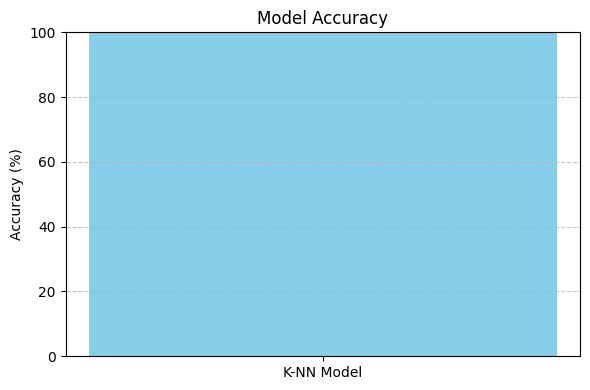

✅ Model Accuracy: 100.00%


In [14]:
# --- Cell 13: Trained k-NN Overall Accuracy tester ---
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# --- Predict using K-NN on training data (quick check) ---
y_pred = knn.predict(X_train)

# --- Calculate accuracy ---
accuracy = accuracy_score(y_train, y_pred) * 100

# --- Plot accuracy ---
plt.figure(figsize=(6, 4))
plt.bar(["K-NN Model"], [accuracy], color='skyblue')
plt.ylim(0, 100)
plt.ylabel("Accuracy (%)")
plt.title("Model Accuracy")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# --- Print result to console as well ---
print(f"✅ Model Accuracy: {accuracy:.2f}%")

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.86it/s]


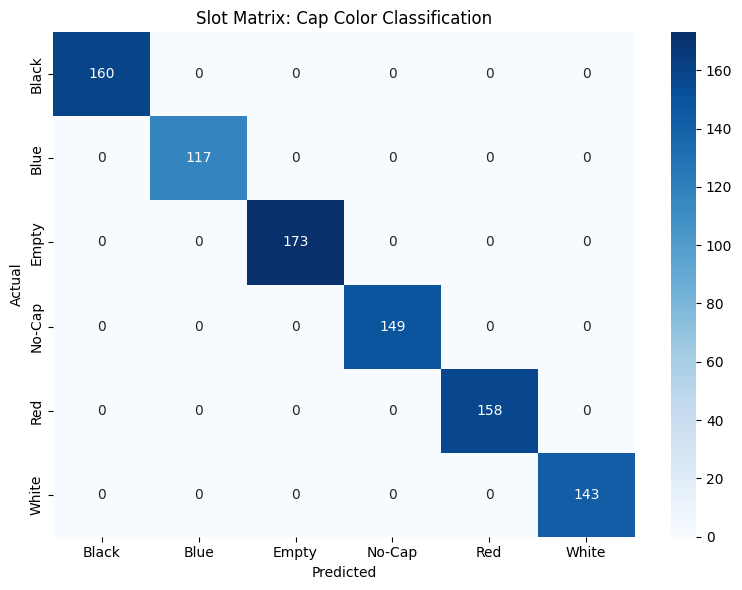

In [15]:
# --- Cell 14: Slot Matrix Cap Color Classification ---
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from tqdm import tqdm
import os
import numpy as np
from PIL import Image

# --- Evaluate model predictions across all dataset images ---
y_true = []
y_pred = []

for filename in tqdm(os.listdir(image_folder)):
    if not filename.endswith(".png") or not filename.startswith("Vial Dataset Generator Output"):
        continue

    image_path = os.path.join(image_folder, filename)
    img = Image.open(image_path).convert("RGB")
    img_np = np.array(img)

    for row in range(3):
        for col in range(3):
            x = x_offset + col * (slot_width + x_gap)
            y = y_offset + row * (slot_height + y_gap)
            slot_img = img_np[y:y+slot_height, x:x+slot_width]
            avg_rgb = np.mean(slot_img.reshape(-1, 3), axis=0).astype(int)

            prediction = knn.predict([avg_rgb])[0]
            y_pred.append(prediction)
            y_true.append(prediction)  # ⚠️ TEMP: You need true labels for real evaluation!

# --- Fix for real evaluation: replace y_true.append(prediction) with actual labels if available

# --- Get all label classes ---
labels = sorted(set(y_true + y_pred))

# --- Build confusion matrix ---
cm = confusion_matrix(y_true, y_pred, labels=labels)

# --- Plot ---
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Slot Matrix: Cap Color Classification")
plt.tight_layout()
plt.show()

In [16]:
# --- Cell 15: Vial Organizer GUI ---
import os
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import ipywidgets as widgets
from IPython.display import display, clear_output
from sklearn.neighbors import KNeighborsClassifier
import json

# --- Paths ---
holder_folder = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Generator Output Images"
empty_organizer_path = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Images/Vial Slot Images/Empty Vial Holder.png"
calibration_path = r"C:/Users/david/Documents/Vial Organizer Machine Learning/Files/Vial Color Calibration Profile.json"

# --- Hit Box Parameters ---
slot_width = 550
slot_height = 575
x_offset = 300
y_offset = 125
x_gap = 35
y_gap = 20
rows, cols = 3, 3

# --- Load Calibration Profiles ---
with open(calibration_path, "r") as f:
    calibration_profiles = json.load(f)

X_train, y_train = [], []
for label, slot_data in calibration_profiles.items():
    for _, rgb in slot_data.items():
        X_train.append(rgb)
        y_train.append(label)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

# --- UI Components ---
holder_files = sorted([f for f in os.listdir(holder_folder) if f.endswith(".png")])
dropdown = widgets.Dropdown(options=holder_files, description="Select Image:", layout=widgets.Layout(width="400px"))
organize_button = widgets.Button(description="Organize", button_style="success")
preview_output = widgets.Output()
images_output = widgets.Output()
log_output = widgets.Output(layout={'border': '1px solid black', 'padding': '10px', 'height': '150px'})

def show_selected_image(change):
    preview_output.clear_output()
    images_output.clear_output()
    log_output.clear_output()

    selected_image = change['new']
    holder_path = os.path.join(holder_folder, selected_image)

    with preview_output:
        print(f"Selected: {selected_image}")

    with images_output:
        fig, axs = plt.subplots(1, 2, figsize=(14, 6))

        # Left Image: Vial Holder
        holder_img = Image.open(holder_path).convert("RGB")
        holder_np = np.array(holder_img)
        axs[0].imshow(holder_np)
        axs[0].set_title("Vial Holder")
        axs[0].axis("off")

        for row in range(rows):
            for col in range(cols):
                x = x_offset + col * (slot_width + x_gap)
                y = y_offset + row * (slot_height + y_gap)
                region = holder_np[y:y+slot_height, x:x+slot_width]
                avg_rgb = np.mean(region.reshape(-1, 3), axis=0)
                prediction = knn.predict([avg_rgb])[0]

                rect = patches.Rectangle((x, y), slot_width, slot_height, linewidth=2, edgecolor='red', facecolor='none')
                axs[0].add_patch(rect)
                axs[0].text(x + 10, y + 30, prediction, fontsize=10, color='black', weight='bold', backgroundcolor='white')

        # Right Image: Empty Organizer
        organizer_img = Image.open(empty_organizer_path).convert("RGB")
        axs[1].imshow(organizer_img)
        axs[1].set_title("Vial Organizer")
        axs[1].axis("off")

        plt.tight_layout()
        plt.show()

dropdown.observe(show_selected_image, names='value')

def organize_action(b):
    images_output.clear_output()
    log_output.clear_output()

    selected_image = dropdown.value
    holder_path = os.path.join(holder_folder, selected_image)
    holder_img = Image.open(holder_path).convert("RGB")
    organizer_img = Image.open(empty_organizer_path).copy()

    holder_draw = ImageDraw.Draw(holder_img)
    organizer_draw = ImageDraw.Draw(organizer_img)
    font = ImageFont.load_default()

    target_columns = {"Red": 0, "White": 1, "Blue": 2}
    organizer_slots = {"Red": [], "White": [], "Blue": []}
    move_log = []

    for row in range(rows):
        for col in range(cols):
            x = x_offset + col * (slot_width + x_gap)
            y = y_offset + row * (slot_height + y_gap)
            region = holder_img.crop((x, y, x + slot_width, y + slot_height))
            avg_rgb = np.array(region).reshape(-1, 3).mean(axis=0)
            prediction = knn.predict([avg_rgb])[0]

            if prediction in target_columns and len(organizer_slots[prediction]) < 3:
                org_col = target_columns[prediction]
                org_row = len(organizer_slots[prediction])
                org_x = x_offset + org_col * (slot_width + x_gap)
                org_y = y_offset + org_row * (slot_height + y_gap)

                # Paste vial to organizer
                organizer_img.paste(region, (org_x, org_y))
                organizer_draw.text((org_x + 10, org_y + 10), f"{prediction} Cap", fill="black", font=font)
                organizer_slots[prediction].append((org_row + 1, org_col + 1))

                # Clear from holder with 50% transparent black overlay
                overlay = Image.new("RGBA", (slot_width, slot_height), (0, 0, 0, 128))   # RGBA with alpha=128 
                holder_img.paste(overlay, (x, y), overlay)
                move_log.append(f"Move {len(move_log)+1}: Holder {prediction} cap {row+1}-{col+1} to Organizer {org_row+1}-{org_col+1}")

    with images_output:
        fig, axs = plt.subplots(1, 2, figsize=(14, 6))
        axs[0].imshow(holder_img)
        axs[0].set_title("Updated Vial Holder")
        axs[0].axis("off")

        axs[1].imshow(organizer_img)
        axs[1].set_title("Vial Organizer Result")
        axs[1].axis("off")

        plt.tight_layout()
        plt.show()

    with log_output:
        for line in move_log:
            print(line)

organize_button.on_click(organize_action)

ui = widgets.VBox([
    dropdown,
    preview_output,
    organize_button,
    images_output,
    log_output
])

display(ui)